# Fraud Detection System analysis
A fraud detection system using the data of [this Kaggle Dataset](https://www.kaggle.com/datasets/mlg-ulb/creditcardfraud) to see more about the data and the problem, see [Reproductible Machine Learning for Credit-Card Fraud Detection - Practical handbook](https://fraud-detection-handbook.github.io/fraud-detection-handbook/index.html)

In [2]:
import pandas
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
raw_data = pandas.read_csv('data/creditcard.csv')
print(raw_data.info())
print(raw_data.describe())
raw_data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


The data doesn't have feature names, but we know that the features V1, V2, ..., V28 are the result of a PCA transformation. The only features which have not been transformed with PCA are 'Time' and 'Amount'. The feature 'Class' is the target variable and it takes value 1 in case of fraud and 0 otherwise.

As we can see, the dataset is unbalanced, with 492 frauds in 284,807 transactions. This is a problem because the model can learn to predict only the majority class, and the minority class will be ignored. To solve this problem, we can use techniques like oversampling, undersampling, or SMOTE. In this notebook, I will use the SMOTE technique to balance the dataset.

## Análisis Exploratorio de Datos (EDA) en Conjuntos de Datos Desbalanceados

El análisis exploratorio de datos (EDA) es una etapa crucial en cualquier proyecto de ciencia de datos. Sin embargo, cuando se trabaja con conjuntos de datos altamente desbalanceados, como en el caso de la detección de fraudes, se presentan varios desafíos que pueden afectar la calidad y la interpretabilidad del análisis. A continuación, se explican algunas de las razones por las cuales el EDA puede ser problemático en estos casos:

1. Representación Inadecuada de la Clase Minoritaria

  En un conjunto de datos desbalanceado, la clase minoritaria (por ejemplo, los casos de fraude) está subrepresentada. Esto puede llevar a que las visualizaciones y estadísticas descriptivas no reflejen adecuadamente las características y patrones de la clase minoritaria. Como resultado, es posible que no se identifiquen correctamente los patrones importantes que distinguen a la clase minoritaria de la clase mayoritaria.

2. Visualizaciones Engañosas

  Las visualizaciones como histogramas, gráficos de barras y gráficos de dispersión pueden estar dominadas por la clase mayoritaria, ocultando patrones importantes de la clase minoritaria. Esto puede llevar a conclusiones incorrectas sobre la distribución y las relaciones en los datos. Por ejemplo, en el siguiente código, las visualizaciones pueden no mostrar claramente los patrones de la clase minoritaria debido al desbalance:

3. Estadísticas Descriptivas Sesgadas

  Las estadísticas descriptivas (como la media, la mediana y la desviación estándar) pueden estar sesgadas hacia la clase mayoritaria. Esto puede dificultar la identificación de características distintivas de la clase minoritaria. Por ejemplo, la media de una característica puede estar dominada por la clase mayoritaria, ocultando cualquier diferencia significativa que pueda existir en la clase minoritaria.

4. Dificultad para Identificar Patrones de Fraude

  En el caso de los fraudes, que son eventos raros, es crucial identificar patrones específicos que los distingan de las transacciones normales. Un conjunto de datos desbalanceado puede dificultar la identificación de estos patrones debido a la falta de suficientes ejemplos de la clase minoritaria. Esto puede llevar a un análisis incompleto y a la falta de descubrimiento de características importantes.

5. Problemas con Algoritmos de Machine Learning

  Los algoritmos de machine learning entrenados en conjuntos de datos desbalanceados tienden a estar sesgados hacia la clase mayoritaria. Esto puede resultar en modelos que tienen una alta precisión general pero un bajo recall para la clase minoritaria, lo que es inaceptable en aplicaciones críticas como la detección de fraudes.

#### Estrategias para Mitigar los Problemas del EDA en Datos Desbalanceados
Para mitigar estos problemas, es común utilizar técnicas de balanceo de datos, como el sobremuestreo de la clase minoritaria, el submuestreo de la clase mayoritaria o el uso de algoritmos específicos para datos desbalanceados. Estas técnicas ayudan a crear un conjunto de datos más equilibrado, lo que permite realizar un EDA más representativo y entrenar modelos de machine learning más efectivos.

In [4]:
from imblearn.under_sampling import ClusterCentroids

# Crear el objeto CC
cc = ClusterCentroids(random_state=3)

# Aplicar CC a los datos
X_resampled, y_resampled = cc.fit_resample(raw_data.drop('Class', axis=1), raw_data['Class'])

# Crear un nuevo DataFrame con los datos resampleados
raw_data_resampled = pandas.concat([pandas.DataFrame(X_resampled, columns=raw_data.columns[:-1]), pandas.DataFrame(y_resampled, columns=['Class'])], axis=1)

print(raw_data_resampled.info())
print(raw_data_resampled.describe())
raw_data_resampled.head()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 984 entries, 0 to 983
Data columns (total 31 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Time    984 non-null    float64
 1   V1      984 non-null    float64
 2   V2      984 non-null    float64
 3   V3      984 non-null    float64
 4   V4      984 non-null    float64
 5   V5      984 non-null    float64
 6   V6      984 non-null    float64
 7   V7      984 non-null    float64
 8   V8      984 non-null    float64
 9   V9      984 non-null    float64
 10  V10     984 non-null    float64
 11  V11     984 non-null    float64
 12  V12     984 non-null    float64
 13  V13     984 non-null    float64
 14  V14     984 non-null    float64
 15  V15     984 non-null    float64
 16  V16     984 non-null    float64
 17  V17     984 non-null    float64
 18  V18     984 non-null    float64
 19  V19     984 non-null    float64
 20  V20     984 non-null    float64
 21  V21     984 non-null    float64
 22  V2

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,109367.255814,0.212078,0.311670,0.079308,0.339230,0.505649,0.100971,0.144726,-0.184486,1.484578,...,-0.058001,-0.083595,0.020991,-0.168063,-0.164482,-0.267482,0.004354,-0.002332,53.610827,0
1,47671.833763,-0.035276,0.068962,0.662387,0.107322,-0.217539,0.099719,-0.142408,0.054091,-0.190469,...,-0.022403,-0.101065,-0.029569,0.016177,0.173841,0.012431,-0.022951,-0.006875,64.967101,0
2,147714.449261,0.326386,0.015670,-0.731663,-0.046941,0.327416,-0.241782,0.045839,-0.019297,-0.024228,...,0.015453,0.105561,0.025102,0.020497,-0.156693,-0.029046,-0.036438,-0.013163,60.488128,0
3,77230.880642,-0.045258,0.183194,0.659484,0.102499,-0.242659,-0.017437,-0.105944,0.082241,-0.268434,...,-0.063749,-0.160332,-0.010649,-0.029691,0.142926,-0.002666,-0.002097,0.018590,58.347583,0
4,11825.296496,-0.286647,0.114054,1.042671,0.242303,-0.023852,-0.185230,-0.142357,-0.163500,1.560843,...,-0.063324,-0.219438,-0.037562,0.058821,0.113793,0.490131,-0.000725,0.001545,58.462803,0


In [6]:
sns.pairplot(raw_data_resampled, hue='Class')

#### Heatmap del Conjunto de Datos Resampleado

A continuación, se presenta un heatmap de las correlaciones entre las características del conjunto de datos resampleado. Este heatmap nos permitirá visualizar las relaciones entre las diferentes variables y detectar posibles patrones que puedan ser útiles para la detección de fraudes.

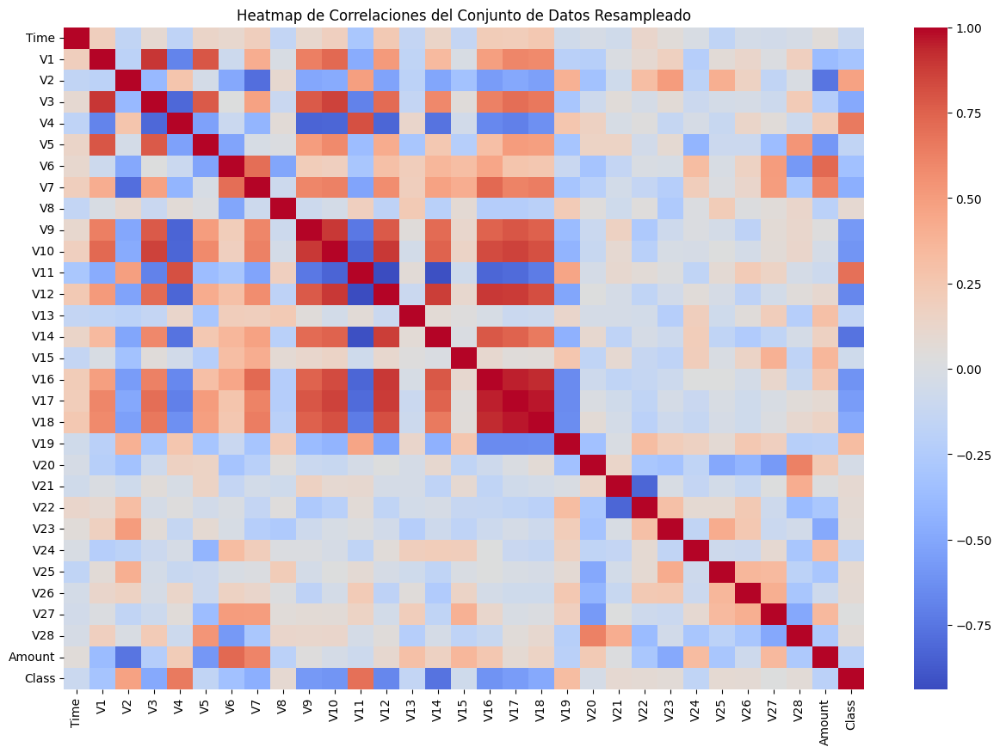

In [8]:
plt.figure(figsize=(15, 10))
sns.heatmap(raw_data_resampled.corr(), fmt=".2f", cmap='coolwarm')
plt.title('Heatmap de Correlaciones del Conjunto de Datos Resampleado')
plt.show()

## Simple ML Aproximation
Para crear un modelo simple de Machine Learning utilizando un Random Forest con los datos resampleados, seguiremos los siguientes pasos:

1. **Dividir los datos**: Separaremos los datos en conjuntos de entrenamiento y prueba.
2. **Entrenar el modelo**: Utilizaremos el algoritmo de Random Forest para entrenar el modelo con los datos de entrenamiento.
3. **Evaluar el modelo**: Evaluaremos el rendimiento del modelo utilizando el conjunto de prueba.

A continuación, se muestra el código para realizar estos pasos:

In [9]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42)

# Crear el modelo de Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Entrenar el modelo
rf_model.fit(X_train, y_train)

# Realizar predicciones
y_pred = rf_model.predict(X_test)

# Evaluar el modelo
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


[[149   1]
 [  2 144]]
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       150
           1       0.99      0.99      0.99       146

    accuracy                           0.99       296
   macro avg       0.99      0.99      0.99       296
weighted avg       0.99      0.99      0.99       296



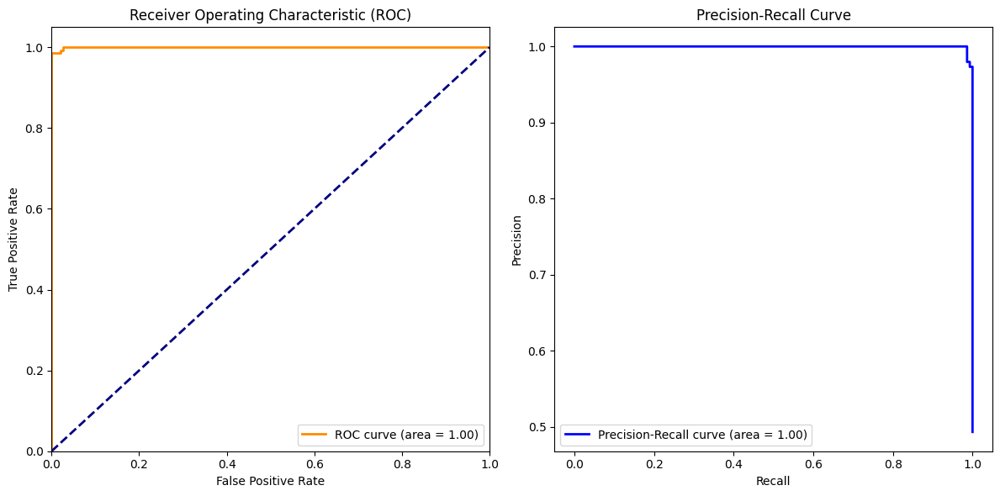

In [10]:
from sklearn.metrics import roc_curve, precision_recall_curve, auc

# Calcular las probabilidades de predicción
y_pred_prob = rf_model.predict_proba(X_test)[:, 1]

# Calcular la curva ROC
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

# Calcular la curva Precision-Recall
precision, recall, _ = precision_recall_curve(y_test, y_pred_prob)
pr_auc = auc(recall, precision)

# Graficar la curva ROC
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")

# Graficar la curva Precision-Recall
plt.subplot(1, 2, 2)
plt.plot(recall, precision, color='blue', lw=2, label='Precision-Recall curve (area = %0.2f)' % pr_auc)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc="lower left")

plt.tight_layout()
plt.show()

[[ 30426 253889]
 [     2    490]]
              precision    recall  f1-score   support

           0       1.00      0.11      0.19    284315
           1       0.00      1.00      0.00       492

    accuracy                           0.11    284807
   macro avg       0.50      0.55      0.10    284807
weighted avg       1.00      0.11      0.19    284807



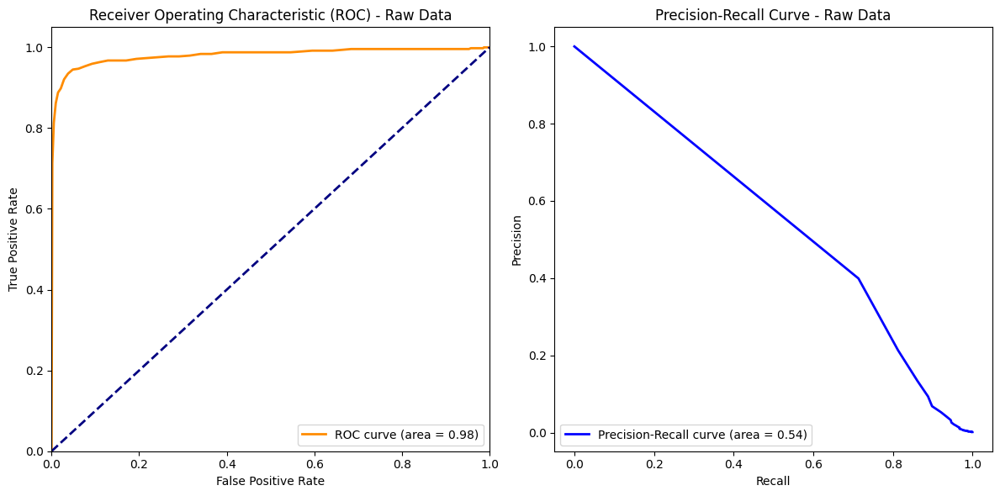

In [11]:
# Separar las características y la variable objetivo
X_raw = raw_data.drop('Class', axis=1)
y_raw = raw_data['Class']

# Realizar predicciones
y_raw_pred = rf_model.predict(X_raw)

# Evaluar el modelo
print(confusion_matrix(y_raw, y_raw_pred))
print(classification_report(y_raw, y_raw_pred))
# Calcular las probabilidades de predicción para todo el conjunto de datos
y_raw_pred_prob = rf_model.predict_proba(X_raw)[:, 1]

# Calcular la curva ROC
fpr_raw, tpr_raw, _ = roc_curve(y_raw, y_raw_pred_prob)
roc_auc_raw = auc(fpr_raw, tpr_raw)

# Calcular la curva Precision-Recall
precision_raw, recall_raw, _ = precision_recall_curve(y_raw, y_raw_pred_prob)
pr_auc_raw = auc(recall_raw, precision_raw)

# Graficar la curva ROC
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(fpr_raw, tpr_raw, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_raw)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Raw Data')
plt.legend(loc="lower right")

# Graficar la curva Precision-Recall
plt.subplot(1, 2, 2)
plt.plot(recall_raw, precision_raw, color='blue', lw=2, label='Precision-Recall curve (area = %0.2f)' % pr_auc_raw)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Raw Data')
plt.legend(loc="lower left")

plt.tight_layout()
plt.show()

## Cambio de estrategia de resampling

In [28]:
from imblearn.under_sampling import EditedNearestNeighbours

# Crear el objeto CC
enn = EditedNearestNeighbours(kind_sel='all')

# Aplicar CC a los datos
X_resampled, y_resampled = enn.fit_resample(raw_data.drop('Class', axis=1), raw_data['Class'])
# Crear un nuevo DataFrame con los datos resampleados
raw_data_resampled = pandas.concat([pandas.DataFrame(X_resampled, columns=raw_data.columns[:-1]), pandas.DataFrame(y_resampled, columns=['Class'])], axis=1)

print(raw_data_resampled.info())
print(raw_data_resampled.describe())
raw_data_resampled.head()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284384 entries, 0 to 284383
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284384 non-null  float64
 1   V1      284384 non-null  float64
 2   V2      284384 non-null  float64
 3   V3      284384 non-null  float64
 4   V4      284384 non-null  float64
 5   V5      284384 non-null  float64
 6   V6      284384 non-null  float64
 7   V7      284384 non-null  float64
 8   V8      284384 non-null  float64
 9   V9      284384 non-null  float64
 10  V10     284384 non-null  float64
 11  V11     284384 non-null  float64
 12  V12     284384 non-null  float64
 13  V13     284384 non-null  float64
 14  V14     284384 non-null  float64
 15  V15     284384 non-null  float64
 16  V16     284384 non-null  float64
 17  V17     284384 non-null  float64
 18  V18     284384 non-null  float64
 19  V19     284384 non-null  float64
 20  V20     284384 non-null  float64
 21  V21     28

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [29]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42)

# Crear el modelo de Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Entrenar el modelo
rf_model.fit(X_train, y_train)

# Realizar predicciones
y_pred = rf_model.predict(X_test)

# Evaluar el modelo
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


[[85186     9]
 [   33    88]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85195
           1       0.91      0.73      0.81       121

    accuracy                           1.00     85316
   macro avg       0.95      0.86      0.90     85316
weighted avg       1.00      1.00      1.00     85316



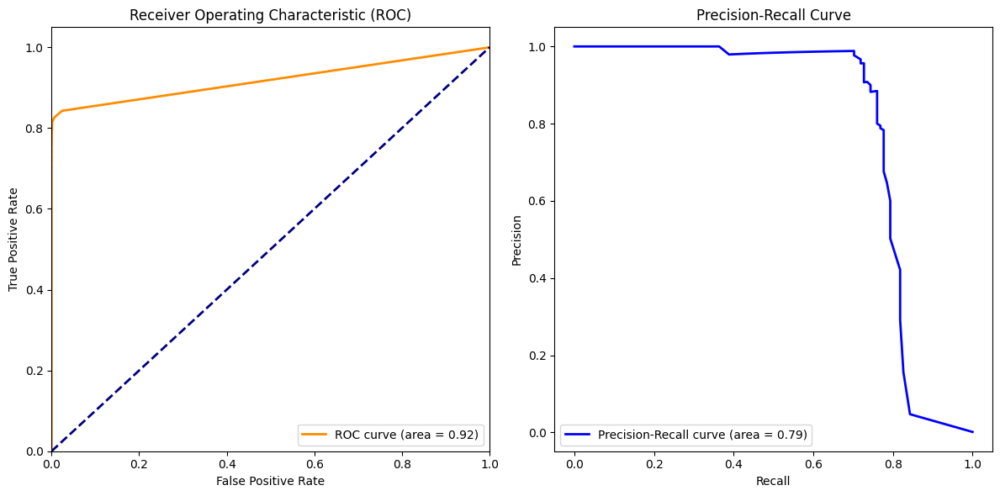

In [30]:
from sklearn.metrics import roc_curve, precision_recall_curve, auc

# Calcular las probabilidades de predicción
y_pred_prob = rf_model.predict_proba(X_test)[:, 1]

# Calcular la curva ROC
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

# Calcular la curva Precision-Recall
precision, recall, _ = precision_recall_curve(y_test, y_pred_prob)
pr_auc = auc(recall, precision)

# Graficar la curva ROC
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")

# Graficar la curva Precision-Recall
plt.subplot(1, 2, 2)
plt.plot(recall, precision, color='blue', lw=2, label='Precision-Recall curve (area = %0.2f)' % pr_auc)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc="lower left")

plt.tight_layout()
plt.show()

[[284306      9]
 [    33    459]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    284315
           1       0.98      0.93      0.96       492

    accuracy                           1.00    284807
   macro avg       0.99      0.97      0.98    284807
weighted avg       1.00      1.00      1.00    284807



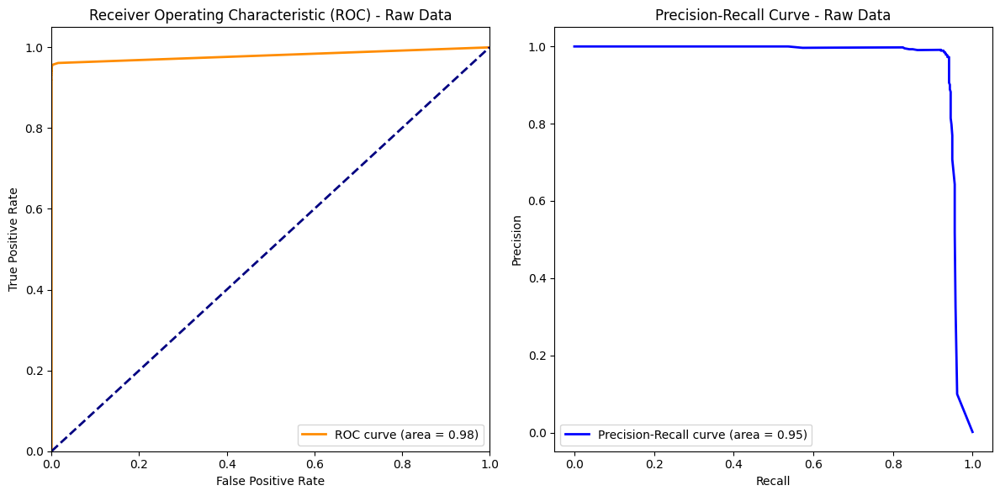

In [31]:
# Separar las características y la variable objetivo
X_raw = raw_data.drop('Class', axis=1)
y_raw = raw_data['Class']

# Realizar predicciones
y_raw_pred = rf_model.predict(X_raw)

# Evaluar el modelo
print(confusion_matrix(y_raw, y_raw_pred))
print(classification_report(y_raw, y_raw_pred))
# Calcular las probabilidades de predicción para todo el conjunto de datos
y_raw_pred_prob = rf_model.predict_proba(X_raw)[:, 1]

# Calcular la curva ROC
fpr_raw, tpr_raw, _ = roc_curve(y_raw, y_raw_pred_prob)
roc_auc_raw = auc(fpr_raw, tpr_raw)

# Calcular la curva Precision-Recall
precision_raw, recall_raw, _ = precision_recall_curve(y_raw, y_raw_pred_prob)
pr_auc_raw = auc(recall_raw, precision_raw)

# Graficar la curva ROC
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(fpr_raw, tpr_raw, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_raw)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Raw Data')
plt.legend(loc="lower right")

# Graficar la curva Precision-Recall
plt.subplot(1, 2, 2)
plt.plot(recall_raw, precision_raw, color='blue', lw=2, label='Precision-Recall curve (area = %0.2f)' % pr_auc_raw)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Raw Data')
plt.legend(loc="lower left")

plt.tight_layout()
plt.show()

In [33]:
# Save the model
import joblib
joblib.dump(rf_model, 'RF_trained_alldata.pkl')

['RF_trained_alldata.pkl']

## Otra estrategia de Resampling #2

In [34]:
# Crear el objeto CC con kind_sel = 'mode'
enn = EditedNearestNeighbours(kind_sel='mode')

# Aplicar CC a los datos
X_resampled, y_resampled = enn.fit_resample(raw_data.drop('Class', axis=1), raw_data['Class'])
# Crear un nuevo DataFrame con los datos resampleados
raw_data_resampled = pandas.concat([pandas.DataFrame(X_resampled, columns=raw_data.columns[:-1]), pandas.DataFrame(y_resampled, columns=['Class'])], axis=1)

print(raw_data_resampled.info())
print(raw_data_resampled.describe())
raw_data_resampled.head()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284797 entries, 0 to 284796
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284797 non-null  float64
 1   V1      284797 non-null  float64
 2   V2      284797 non-null  float64
 3   V3      284797 non-null  float64
 4   V4      284797 non-null  float64
 5   V5      284797 non-null  float64
 6   V6      284797 non-null  float64
 7   V7      284797 non-null  float64
 8   V8      284797 non-null  float64
 9   V9      284797 non-null  float64
 10  V10     284797 non-null  float64
 11  V11     284797 non-null  float64
 12  V12     284797 non-null  float64
 13  V13     284797 non-null  float64
 14  V14     284797 non-null  float64
 15  V15     284797 non-null  float64
 16  V16     284797 non-null  float64
 17  V17     284797 non-null  float64
 18  V18     284797 non-null  float64
 19  V19     284797 non-null  float64
 20  V20     284797 non-null  float64
 21  V21     28

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [35]:
# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42)

# Crear el modelo de Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Entrenar el modelo
rf_model.fit(X_train, y_train)

# Realizar predicciones
y_pred = rf_model.predict(X_test)

# Evaluar el modelo
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


[[85310     6]
 [   28    96]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85316
           1       0.94      0.77      0.85       124

    accuracy                           1.00     85440
   macro avg       0.97      0.89      0.92     85440
weighted avg       1.00      1.00      1.00     85440



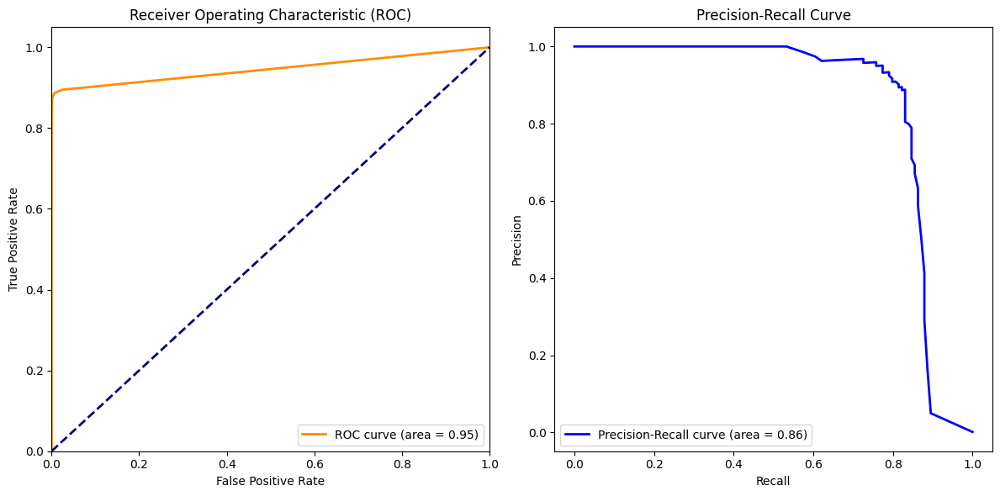

[[284309      6]
 [    28    464]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    284315
           1       0.99      0.94      0.96       492

    accuracy                           1.00    284807
   macro avg       0.99      0.97      0.98    284807
weighted avg       1.00      1.00      1.00    284807



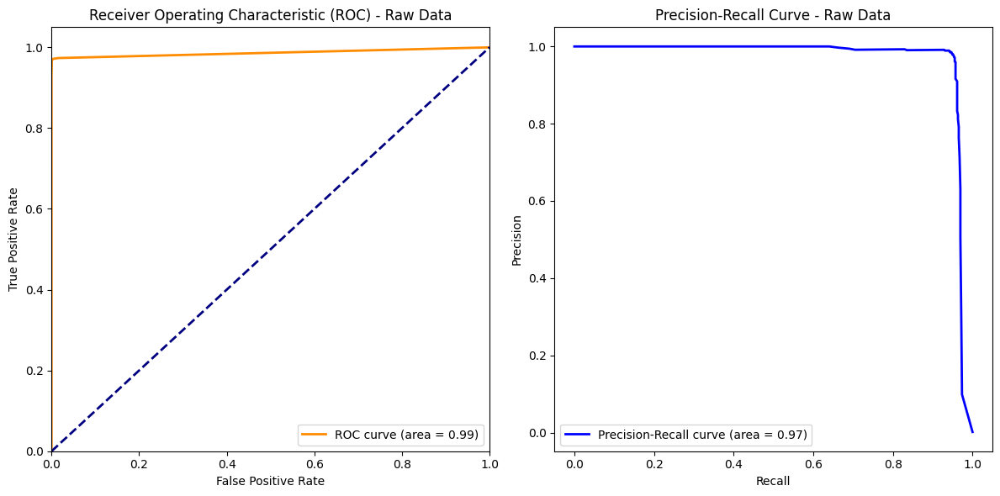

In [36]:
# Calcular las probabilidades de predicción
y_pred_prob = rf_model.predict_proba(X_test)[:, 1]

# Calcular la curva ROC
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

# Calcular la curva Precision-Recall
precision, recall, _ = precision_recall_curve(y_test, y_pred_prob)
pr_auc = auc(recall, precision)

# Graficar la curva ROC
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")

# Graficar la curva Precision-Recall
plt.subplot(1, 2, 2)
plt.plot(recall, precision, color='blue', lw=2, label='Precision-Recall curve (area = %0.2f)' % pr_auc)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc="lower left")

plt.tight_layout()
plt.show()

# Separar las características y la variable objetivo
X_raw = raw_data.drop('Class', axis=1)
y_raw = raw_data['Class']

# Realizar predicciones
y_raw_pred = rf_model.predict(X_raw)

# Evaluar el modelo
print(confusion_matrix(y_raw, y_raw_pred))
print(classification_report(y_raw, y_raw_pred))
# Calcular las probabilidades de predicción para todo el conjunto de datos
y_raw_pred_prob = rf_model.predict_proba(X_raw)[:, 1]

# Calcular la curva ROC
fpr_raw, tpr_raw, _ = roc_curve(y_raw, y_raw_pred_prob)
roc_auc_raw = auc(fpr_raw, tpr_raw)

# Calcular la curva Precision-Recall
precision_raw, recall_raw, _ = precision_recall_curve(y_raw, y_raw_pred_prob)
pr_auc_raw = auc(recall_raw, precision_raw)

# Graficar la curva ROC
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(fpr_raw, tpr_raw, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_raw)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Raw Data')
plt.legend(loc="lower right")

# Graficar la curva Precision-Recall
plt.subplot(1, 2, 2)
plt.plot(recall_raw, precision_raw, color='blue', lw=2, label='Precision-Recall curve (area = %0.2f)' % pr_auc_raw)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Raw Data')
plt.legend(loc="lower left")

plt.tight_layout()
plt.show()

# No Resampling Strategy

In [37]:
# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(raw_data.drop(columns='Class'), raw_data['Class'], test_size=0.3, random_state=42)

# Crear el modelo de Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Entrenar el modelo
rf_model.fit(X_train, y_train)

# Realizar predicciones
y_pred = rf_model.predict(X_test)

# Evaluar el modelo
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[85301     6]
 [   27   109]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85307
           1       0.95      0.80      0.87       136

    accuracy                           1.00     85443
   macro avg       0.97      0.90      0.93     85443
weighted avg       1.00      1.00      1.00     85443



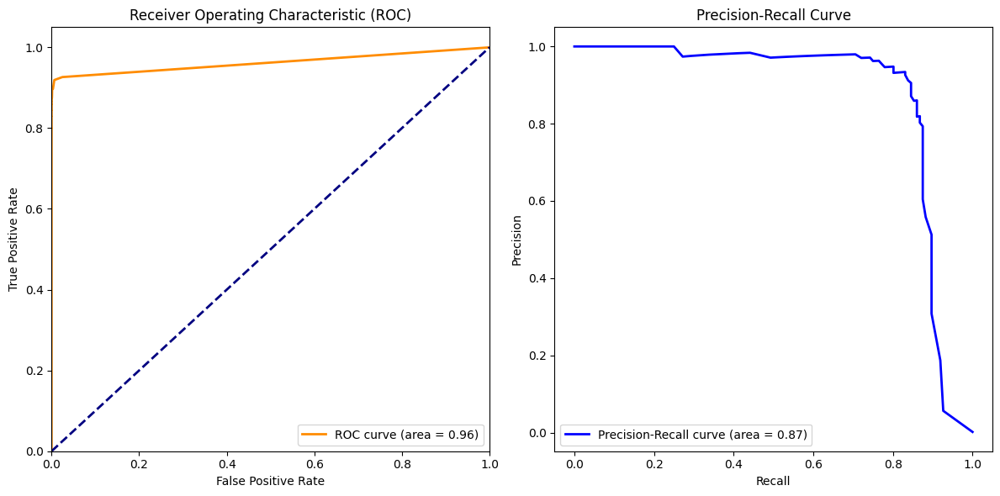

In [38]:
# Calcular las probabilidades de predicción
y_pred_prob = rf_model.predict_proba(X_test)[:, 1]

# Calcular la curva ROC
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

# Calcular la curva Precision-Recall
precision, recall, _ = precision_recall_curve(y_test, y_pred_prob)
pr_auc = auc(recall, precision)

# Graficar la curva ROC
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")

# Graficar la curva Precision-Recall
plt.subplot(1, 2, 2)
plt.plot(recall, precision, color='blue', lw=2, label='Precision-Recall curve (area = %0.2f)' % pr_auc)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc="lower left")

plt.tight_layout()
plt.show()